# Sizes/shapes of a Sample timestep

Encode the images as they are and see the resolutions at each block

In [1]:
try:
    from network.models.building_blocks.resnet_FM import resnet34
except ModuleNotFoundError:
    import sys
    sys.path.append('/data/121-2/Experiments/dporres/CILv2_multiview')
    from network.models.building_blocks.resnet_FM import resnet34


/home/dporres/miniconda3/envs/cilv2/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/dporres/miniconda3/envs/cilv2/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/dporres/miniconda3/envs/cilv2/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/dporres/miniconda3/envs/cilv2/lib/pyt

In [2]:
model = resnet34(pretrained=True)

In [3]:
import torchvision.transforms.functional as TF
from PIL import Image
import os

root = '/data/121-2/Experiments/dporres/CILv2_multiview/test_data/ted_h2_1_1'
img_name = 'rgb_central000123.jpg'
inet_mean = [0.485, 0.456, 0.406]
inet_std = [0.229, 0.224, 0.225]

path = os.path.join(root, img_name)
image = Image.open(path)
image = TF.to_tensor(image)
image = TF.normalize(image, mean=inet_mean, std=inet_std)

In [4]:
image.shape

torch.Size([3, 540, 960])

In [5]:
resnet_blocks = model.get_layers_features(image.unsqueeze(0))

In [6]:
for block in resnet_blocks:
    print(block.shape)

torch.Size([1, 64, 270, 480])
torch.Size([1, 64, 135, 240])
torch.Size([1, 128, 68, 120])
torch.Size([1, 256, 34, 60])
torch.Size([1, 512, 17, 30])


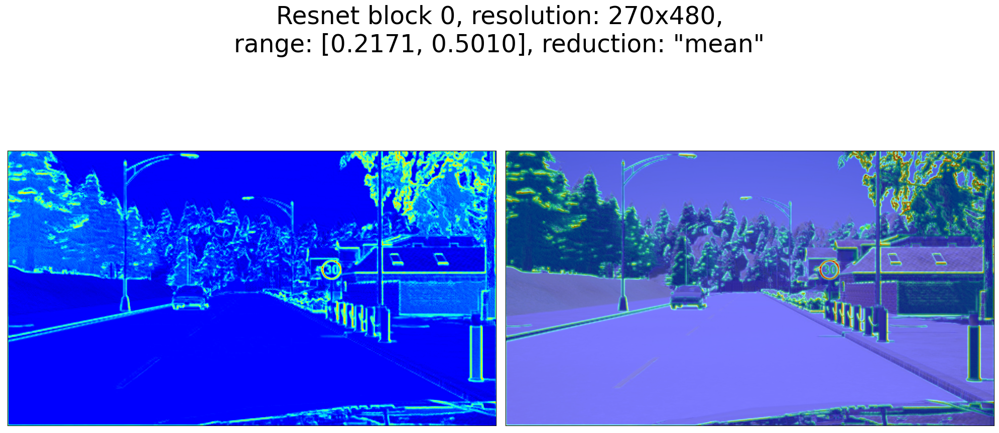

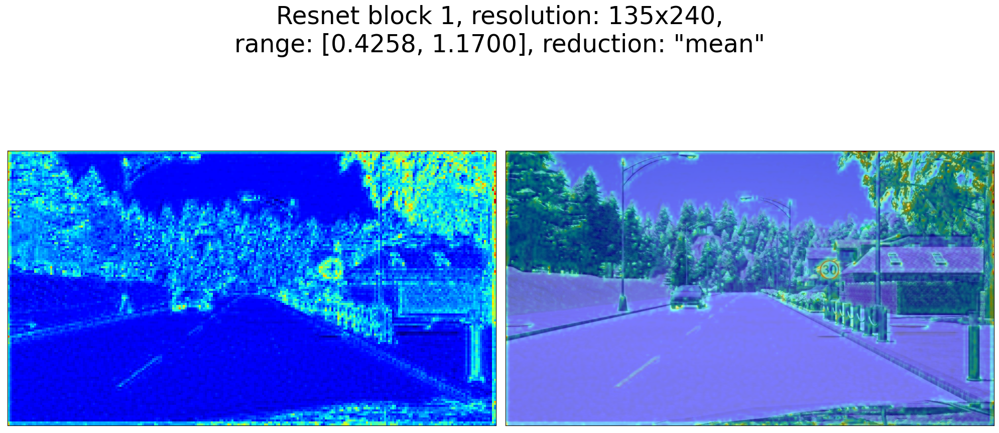

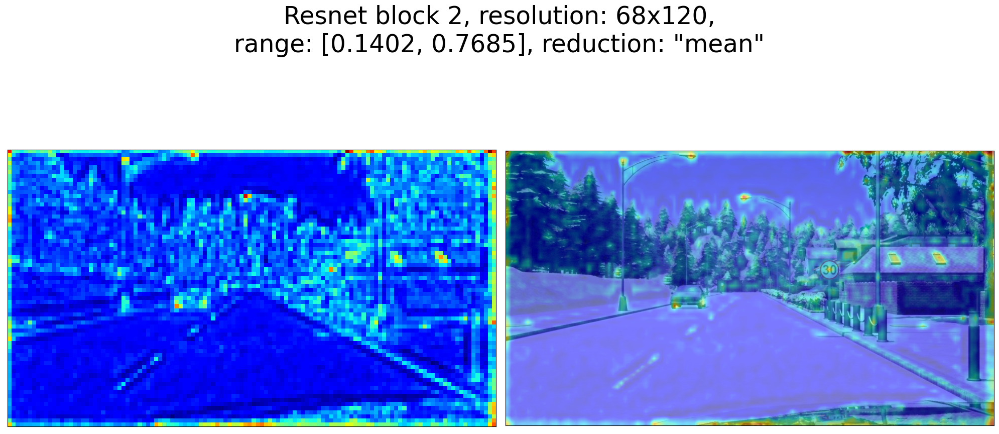

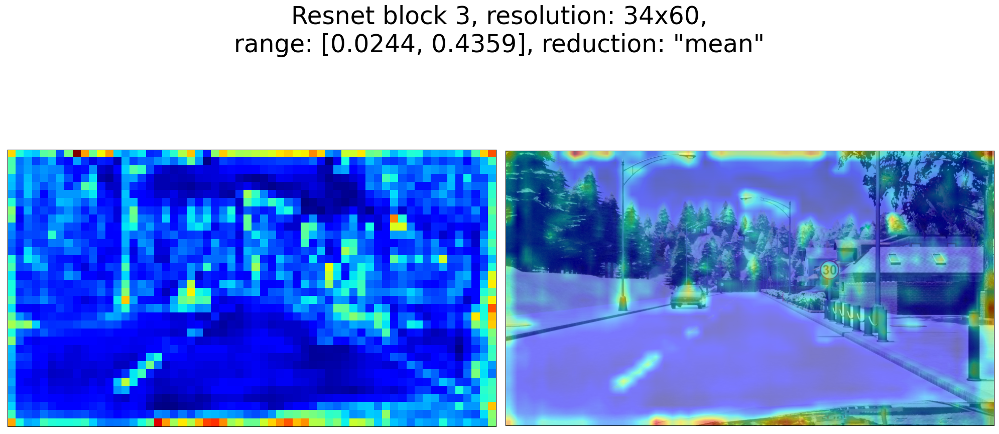

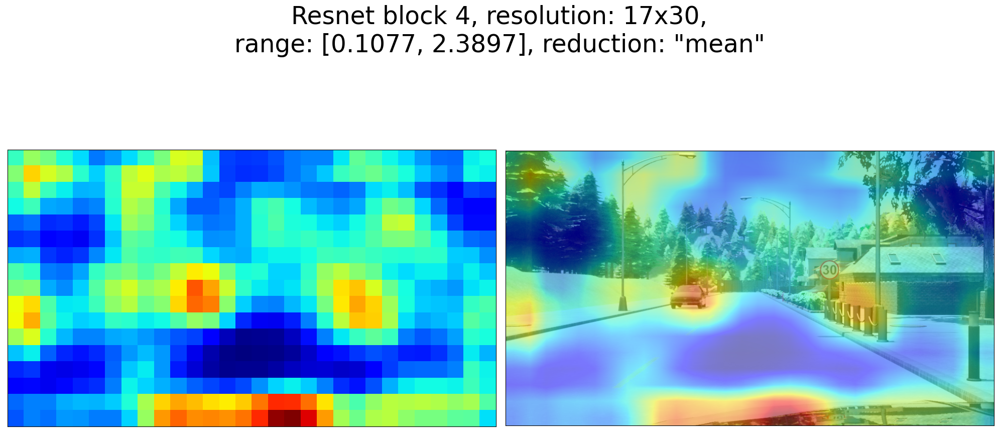

In [8]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import torch
from einops import reduce
import cv2

reduction = 'mean'

for idx, res in enumerate(resnet_blocks):
    num_cameras = res.shape[0]
    # Average over the channels (dim=1)
    res = reduce(res, 'cam dim h w -> cam h w', reduction)
    
    # Plot the three cameras side by side
    fig, ax = plt.subplots(num_cameras, 2, figsize=(20, 11.2 * num_cameras))
    fig.suptitle(f'Resnet block {idx}, resolution: {res.shape[-2]}x{res.shape[-1]},'
                 f'\nValue range: [{res.min().item():.4f}, {res.max().item():.4f}], reduction: "{reduction}"', 
                 fontsize=35)

    for cam in range(num_cameras):
        ax[0].imshow(res.detach().numpy()[cam], cmap='jet')
        ax[0].set_xticks([])
        ax[0].set_yticks([])

        img = image
        img = TF.normalize(img, [-0.485/0.229, -0.456/0.224, -0.406/0.255], [1/0.229, 1/0.224, 1/0.255])
        img = torch.clamp(img, 0, 1)

        res_up = cv2.resize(res.detach().numpy()[cam], (img.size(2), img.size(1)), interpolation=cv2.INTER_LINEAR)
        # res_up = TF.resize(res[cam], img.size(-1), antialias=True)
        ax[1].imshow(img.detach().numpy().transpose(1, 2, 0))
        ax[1].imshow(res_up, cmap='jet', alpha=0.5)
        ax[1].set_xticks([])
        ax[1].set_yticks([])


    fig.tight_layout()
    fig.subplots_adjust(top=0.94)
    plt.show()

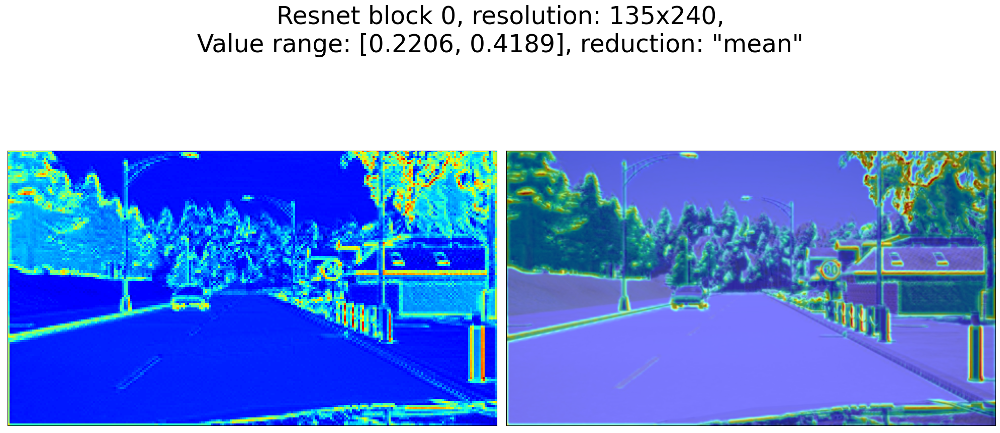

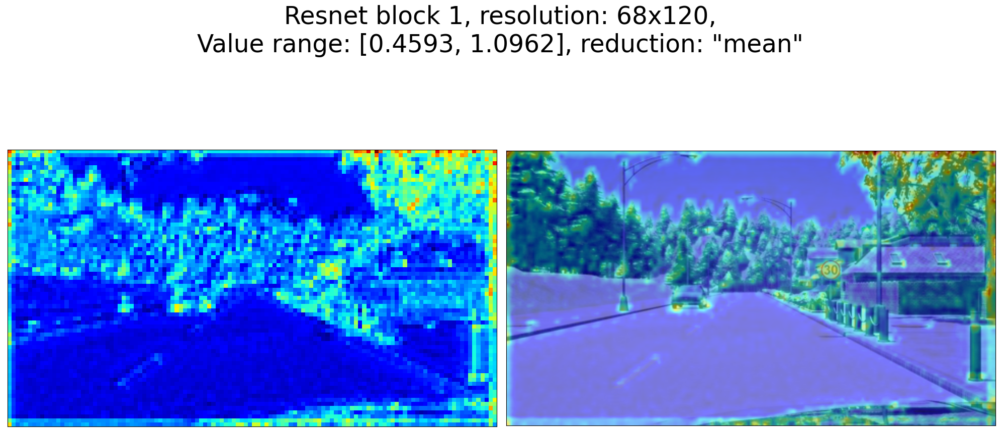

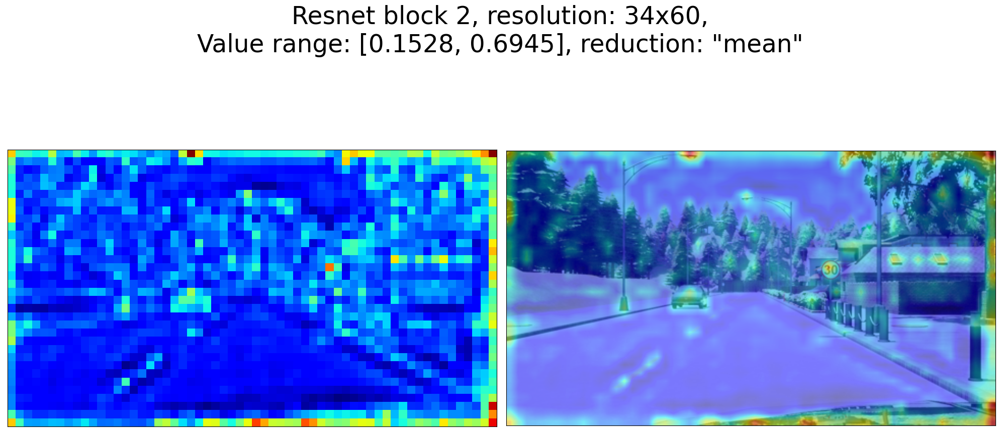

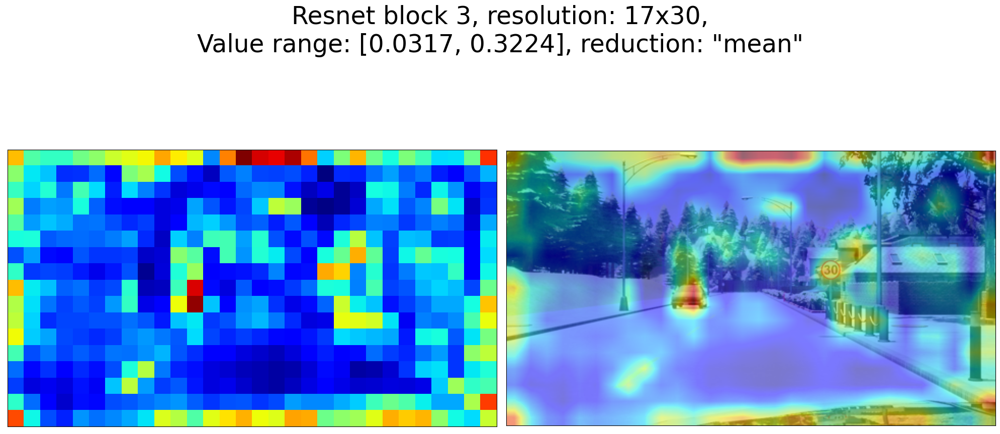

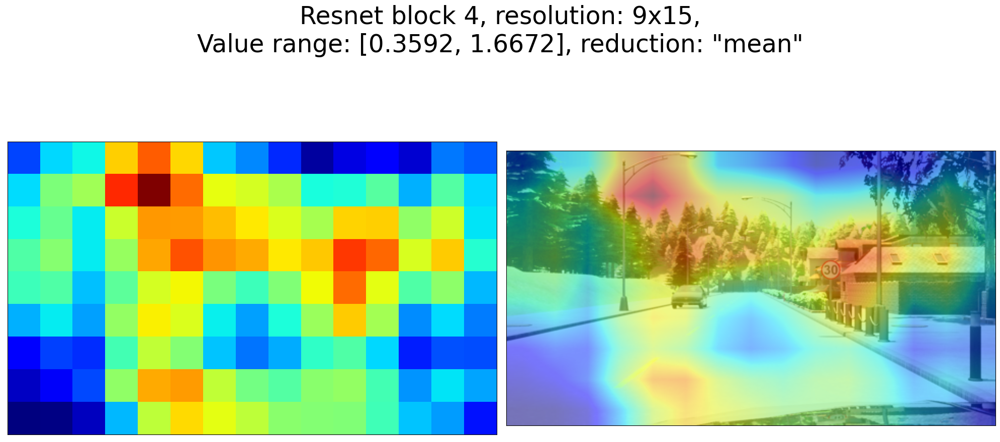

In [11]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import torch
from einops import reduce
import cv2

root = '/data/121-2/Experiments/dporres/CILv2_multiview/test_data/ted_h2_1_1'
img_name = 'rgb_central000123.jpg'
inet_mean = [0.485, 0.456, 0.406]
inet_std = [0.229, 0.224, 0.225]

path = os.path.join(root, img_name)
image = Image.open(path)
image = image.resize([d//2 for d in image.size])
image = TF.to_tensor(image)
image = TF.normalize(image, mean=inet_mean, std=inet_std)

resnet_blocks = model.get_layers_features(image.unsqueeze(0))

reduction = 'mean'

for idx, res in enumerate(resnet_blocks):
    num_cameras = res.shape[0]
    # Average over the channels (dim=1)
    res = reduce(res, 'cam dim h w -> cam h w', reduction)
    
    # Plot the three cameras side by side
    fig, ax = plt.subplots(num_cameras, 2, figsize=(20, 11.2 * num_cameras))
    fig.suptitle(f'Resnet block {idx}, resolution: {res.shape[-2]}x{res.shape[-1]},'
                 f'\nValue range: [{res.min().item():.4f}, {res.max().item():.4f}], reduction: "{reduction}"', 
                 fontsize=35)

    for cam in range(num_cameras):
        ax[0].imshow(res.detach().numpy()[cam], cmap='jet')
        ax[0].set_xticks([])
        ax[0].set_yticks([])

        img = image
        img = TF.normalize(img, [-0.485/0.229, -0.456/0.224, -0.406/0.255], [1/0.229, 1/0.224, 1/0.255])
        img = torch.clamp(img, 0, 1)

        res_up = cv2.resize(res.detach().numpy()[cam], (img.size(2), img.size(1)), interpolation=cv2.INTER_LINEAR)
        # res_up = TF.resize(res[cam], img.size(-1), antialias=True)
        ax[1].imshow(img.detach().numpy().transpose(1, 2, 0))
        ax[1].imshow(res_up, cmap='jet', alpha=0.5)
        ax[1].set_xticks([])
        ax[1].set_yticks([])


    fig.tight_layout()
    fig.subplots_adjust(top=0.94)
    plt.show()